In [0]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [0]:
# memory footprint support libraries/code
!ln -sf /opt/bin/nvidia-smi /usr/bin/nvidia-smi
!pip install gputil
!pip install psutil
!pip install humanize
import psutil
import humanize
import os
import GPUtil as GPU
GPUs = GPU.getGPUs()
# XXX: only one GPU on Colab and isn’t guaranteed
gpu = GPUs[0]
def printm():
 process = psutil.Process(os.getpid())
 print("Gen RAM Free: " + humanize.naturalsize( psutil.virtual_memory().available ), " | Proc size: " + humanize.naturalsize( process.memory_info().rss))
 print("GPU RAM Free: {0:.0f}MB | Used: {1:.0f}MB | Util {2:3.0f}% | Total {3:.0f}MB".format(gpu.memoryFree, gpu.memoryUsed, gpu.memoryUtil*100, gpu.memoryTotal))
printm()

In [0]:
from google.colab import drive
drive.mount('/content/gdrive')
!pip install kaggle
!ls
!mkdir .kaggle
import json
token = {"username": "kaustavoptimistic","key":"3bd32c981cd36e4e8856b78faadf4656"}
with open('/content/.kaggle/kaggle.json', 'w') as file:
    json.dump(token, file)
##!chmod 600 /content/.kaggle/kaggle.json
!cp /content/.kaggle/kaggle.json ~/.kaggle/kaggle.json
!mkdir ~/.kaggle
!cp /content/.kaggle/kaggle.json ~/.kaggle/kaggle.json
!kaggle config set -n path -v{/content}
!kaggle competitions download -c histopathologic-cancer-detection -p /content

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive
gdrive	sample_data
cp: cannot create regular file '/root/.kaggle/kaggle.json': No such file or directory
- path is now set to: {/content}
  0% 0.00/1.33M [00:00<?, ?B/s]
100% 1.33M/1.33M [00:00<00:00, 44.8MB/s]
 98% 5.00M/5.10M [00:00<00:00, 26.4MB/s]
100% 5.10M/5.10M [00:00<00:00, 25.0MB/s]
100% 1.30G/1.30G [00:14<00:00, 95.6MB/s]
100% 1.30G/1.30G [00:14<00:00, 99.5MB/s]
100% 4.97G/4.98G [01:09<00:00, 134MB/s]
100% 4.98G/4.98G [01:09<00:00, 77.0MB/s]


In [0]:
###For saving model in google drive

!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

# 1. Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

    100% |████████████████████████████████| 993kB 21.1MB/s 


In [0]:
import os
print(os.listdir('./'))

['.config', 'test.zip', 'adc.json', '.kaggle', 'train_labels.csv.zip', 'gdrive', 'train.zip', 'sample_submission.csv.zip', 'sample_data']


In [0]:
os.mkdir('input')
os.mkdir('input/train')
os.mkdir('input/test')

In [0]:
import zipfile
zip_ref = zipfile.ZipFile('train_labels.csv.zip', 'r')
zip_ref.extractall('./input')
zip_ref.close()
print('train label unzipped')

import zipfile
zip_ref = zipfile.ZipFile('train.zip', 'r')
zip_ref.extractall('./input/train')
zip_ref.close()
print('train unzipped')

##
import zipfile
zip_ref = zipfile.ZipFile('test.zip', 'r')
zip_ref.extractall('./input/test')
zip_ref.close()
print('test unzipped')

##
import zipfile
zip_ref = zipfile.ZipFile('sample_submission.csv.zip', 'r')
zip_ref.extractall('./input')
zip_ref.close()
print('sample_submission unzipped')

##

print(len(os.listdir('./input/train')))
print(len(os.listdir('./input/test')))
print(os.listdir('./input'))


train label unzipped


In [0]:
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory

import os
from glob import glob
from random import shuffle
import cv2
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import ImageDataGenerator
from keras.layers import Convolution1D, concatenate, SpatialDropout1D, GlobalMaxPool1D, GlobalAvgPool1D, Embedding, \
    Conv2D, SeparableConv1D, Add, BatchNormalization, Activation, GlobalAveragePooling2D, LeakyReLU, Flatten
from keras.layers import Dense, Input, Dropout, MaxPooling2D, Concatenate, GlobalMaxPooling2D, GlobalAveragePooling2D, \
    Lambda, Multiply, LSTM, Bidirectional, PReLU, MaxPooling1D
from keras.layers.pooling import _GlobalPooling1D
from keras.losses import mae, sparse_categorical_crossentropy, binary_crossentropy
from keras.models import Model
from keras.applications.nasnet import NASNetMobile, NASNetLarge, preprocess_input
from keras.optimizers import Adam, RMSprop
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from imgaug import augmenters as iaa
import imgaug as ia
print(os.listdir("./input"))

# Any results you write to the current directory are saved as output.

In [0]:
##f  = pd.read_csv('input/train_labels.csv')

In [0]:
from fastai.vision import *
import matplotlib.pyplot as plt
from PIL import Image
from fastai import __version__
print(__version__)
from torchvision.models import *
from fastai import *

In [0]:
#from fastai import defaults
#from fastai.vision import create_cnn, get_transforms
#from fastai.metrics import accuracy
from fastai.callbacks import EarlyStoppingCallback, SaveModelCallback, CSVLogger, ReduceLROnPlateauCallback
#from fastai.vision.data import ImageItemList, imagenet_stats

In [0]:
##Upload train file 
from google.colab import files
files.upload()

In [0]:
df_train_fold1 = pd.read_csv('df_train_fold1_upd.csv')
df_train_fold1.head(2)

,id,label
0,5ab20e9e61acff6a36119cd997999ed73164b9db,1
1,60b001b4b8a139f595f7a97ec94ffbea99234220,0


In [0]:
##Upload Valid file
from google.colab import files
files.upload()

Saving df_valid_fold1_upd.csv to df_valid_fold1_upd.csv


{'df_valid_fold1_upd.csv': b'id,label\r\n472043c90b87eff0915a36d4a6497f33d43c7b10,0\r\na03aa5f0d1138e607998f63249dbf1023e25bd9d,1\r\nc7b1de3daa6c499f364c583317f739445d04b15a,0\r\nc43ef5e63c4eb07e878590d6e14800e9850ab147,1\r\n26ea182b2e21a68235461b3ecee141a03f4703b0,1\r\n9dc7c811c5c6b5fdabb1917009e6bac6bc8e421e,0\r\ne97c8b804ecfaab671e676f96f08752703e15372,1\r\n46a698f11c84a823e0e4faf6e13042f0589f7d73,1\r\n5c68b1e8da73adceb82978f59b7d3db0d572a258,0\r\nff4b4a9c1bd67c01f1c3a019a35bab4594c0a90a,0\r\n7bc219c89426fb97584c5ed048684fb1a15d82f7,0\r\n113b1cbf2911acadaade09fcbae3890452f365ab,0\r\nb1791012cb4950386ff30a9de936035c26b182b0,0\r\nebecda1b573ae6d7e0889604ac7fb58a370534f6,1\r\ncb6b5cf440e21893166aa3a6150ae30c8faf53b0,1\r\n0baf0fbe34dd3562ba035e12107e7abc47296c36,1\r\n04373f0605f33f10f8a5343bf5ae72410040d82e,0\r\n7274267e6ab934f639d038f9a65dcd159a65578f,1\r\neee886698f4920e9daff4aa72ddf0e55db57a8fc,1\r\n36082f33d1c0750ff2545d969736ccea0cbf4d58,1\r\n6add8a3027e99cf67e0a3e856493f785c577a42

In [0]:
df_valid_fold1 = pd.read_csv('df_valid_fold1_upd.csv')
df_valid_fold1.head(2)

,id,label
0,472043c90b87eff0915a36d4a6497f33d43c7b10,0
1,a03aa5f0d1138e607998f63249dbf1023e25bd9d,1


In [0]:
train_idx = range(0,len(df_train_fold1))
valid_idx = range(len(df_train_fold1),(len(df_train_fold1) + len(df_valid_fold1)))
print(train_idx, valid_idx )

range(0, 176020) range(176020, 220025)


In [0]:
df_fold1 = pd.concat([df_train_fold1,df_valid_fold1])
print(len(df_fold1))
##df_fold1.head(2)

df_fold1.to_csv('df_fold1.csv', index = False)
print('df_fold1 written')

220025
df_fold1 written


In [0]:
import shutil
##
shutil.move('./df_fold1.csv','input/train/df_fold1.csv')

'input/train/df_fold1.csv'

In [0]:
from imgaug import augmenters as iaa

aug1 = iaa.OneOf([
    iaa.Affine(rotate=0),
    ##iaa.AdditiveGaussianNoise(scale=0.2*255),
    iaa.Affine(rotate=90),
    iaa.Affine(rotate=270),
    iaa.Affine(rotate=180),
])

In [0]:
##not working
##tfms = get_transforms(do_flip=True, flip_vert=True, max_rotate=.0, max_zoom=.1,
##                      max_lighting=0.05, max_warp=0.,xtra_tfms=[iaa.Affine(rotate=90),iaa.Affine(rotate=180),iaa.Affine(rotate=270)])

path = './input/'
test_folder=f'{path}test'

In [0]:
from torchvision.transforms import *

In [0]:
import numpy as np
print(np.random.rand())

0.1934323614881902


In [0]:
def _random_rotate_img():
    "Rotate image by `degrees`."
    prob = np.random.rand()
    if prob <= 0.25:
      degrees =0
    elif (prob > 0.25) and (prob <= 0.5):
      degrees =90
    elif (prob > 0.5) and (prob <= 0.75):
      degrees =180
    else:
      degrees =270
    
    angle = degrees * math.pi / 180
    return [[cos(angle), -sin(angle), 0.],
            [sin(angle),  cos(angle), 0.],
            [0.        ,  0.        , 1.]]
random_rotate_img = TfmAffine(_random_rotate_img)

In [0]:
## Gaussian Blur for image augmentation

def gaussian_kernel(size, sigma=1., dim=2, channels=3):
    # The gaussian kernel is the product of the gaussian function of each dimension.
    # kernel_size should be an odd number.
    
    kernel_size = 2*size + 1

    kernel_size = [kernel_size] * dim
    sigma = [sigma] * dim
    kernel = 1
    meshgrids = torch.meshgrid([torch.arange(size, dtype=torch.float32) for size in kernel_size])
    
    for size, std, mgrid in zip(kernel_size, sigma, meshgrids):
        mean = (size - 1) / 2
        kernel *= 1 / (std * math.sqrt(2 * math.pi)) * torch.exp(-((mgrid - mean) / (2 * std)) ** 2)

    # Make sure sum of values in gaussian kernel equals 1.
    kernel = kernel / torch.sum(kernel)

    # Reshape to depthwise convolutional weight
    kernel = kernel.view(1, 1, *kernel.size())
    kernel = kernel.repeat(channels, *[1] * (kernel.dim() - 1))

    return kernel

def _gaussian_blur(x, size:uniform_int):
    kernel = gaussian_kernel(size=size)
    kernel_size = 2*size + 1

    x = x[None,...]
    padding = int((kernel_size - 1) / 2)
    x = F.pad(x, (padding, padding, padding, padding), mode='reflect')
    x = torch.squeeze(F.conv2d(x, kernel, groups=3))

    return x

gaussian_blur = TfmPixel(_gaussian_blur)

In [0]:
def _jitter(c):
    "Replace pixels by random neighbors at `magnitude`."
    val =np.linspace(-0.05,0.05,5)
    prob = np.random.rand()
    if prob <= 0.20:
      magnitude = val[0]
    elif (prob > 0.20) and (prob <= 0.4):
      magnitude = val[1]
    elif (prob > 0.4) and (prob <= 0.6):
      magnitude = val[2]
    elif (prob > 0.6) and (prob <= 0.8):
      magnitude = val[3]
    else:
      magnitude = val[4]
    c.flow.add_((torch.rand_like(c.flow)-0.5)*magnitude*2)
    return c
jitter = TfmCoord(_jitter)

In [0]:
path = './input/'
tfms= get_transforms( do_flip=True, flip_vert=True, max_rotate=0, max_zoom=1., max_lighting=0.05, max_warp=0,
                      xtra_tfms=[random_rotate_img()])
                    ##  xtra_tfms=[random_rotate_img(),jitter() ])   jitter not working 
                    ##rotate(degrees=0),rotate(degrees=90), rotate(degrees=180),rotate(degrees=270)])
                    ##rotate(degrees=0, p=0.25), rotate(degrees=90, p=0.25), rotate(degrees=180, p=0.25), rotate(degrees=270, p=0.25),
                     ##, jitter = 0.5
                    
##batchsize
bs = 64
image_size = 96


data = (ImageList.from_df(df_fold1 ,path, suffix='.tif',folder='train')                       #Where to find the data? -> in path and its subfolders
        .split_by_idxs(train_idx, valid_idx)                            #How to split in train/valid? -> use the folders
        .label_from_df(cols = 1)                          #How to label? -> depending on the folder of the filenames
        .add_test_folder('test')                            #  Optionally add a test set (here default name is test)
        .transform(tfms, size=image_size)                       #Data augmentation? -> use tfms with a size of 64
        .databunch(bs = bs))                                #Finally? -> use the defaults for conversion to ImageDataBunch
        
stats=data.batch_stats()
##data.normalize(imagenet_stats);
data.normalize(stats)


ImageDataBunch;

Train: LabelList (176020 items)
x: ImageList
Image (3, 96, 96),Image (3, 96, 96),Image (3, 96, 96),Image (3, 96, 96),Image (3, 96, 96)
y: CategoryList
1,0,1,0,0
Path: input;

Valid: LabelList (44005 items)
x: ImageList
Image (3, 96, 96),Image (3, 96, 96),Image (3, 96, 96),Image (3, 96, 96),Image (3, 96, 96)
y: CategoryList
0,1,0,1,1
Path: input;

Test: LabelList (57458 items)
x: ImageList
Image (3, 96, 96),Image (3, 96, 96),Image (3, 96, 96),Image (3, 96, 96),Image (3, 96, 96)
y: EmptyLabelList
,,,,
Path: input

In [0]:
##len(learn.data.valid_ds.items)

In [0]:


#src = (ImageItemList.from_csv(PATH, folder='train', csv_name='train_labels.csv', suffix='.tif')
#      .random_split_by_pct(0.1, seed=77)
#      .label_from_df()
#      .add_test_folder())



#tfms = get_transforms(do_flip=True, flip_vert=True, max_rotate=0, max_zoom=1., max_lighting=0.05, max_warp=0)

#data = (src.transform(tfms, size=96, resize_method=ResizeMethod.SQUISH)
#       .databunch(bs=64, path='.'))

#data.normalize(imagenet_stats);

#stats=data.batch_stats()        
#data.normalize(stats)

In [0]:


print(data.classes); data.c



[0, 1]


2

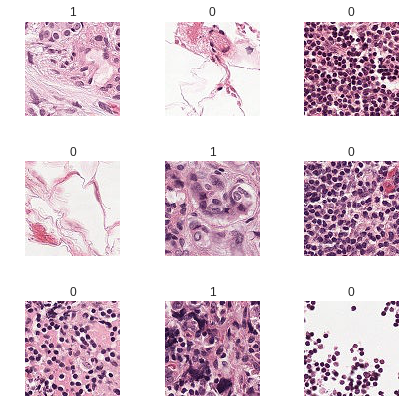

In [0]:
data.show_batch(rows = 3, figsize = (6,6))

In [0]:


from sklearn.metrics import roc_auc_score

def auc_score(y_pred,y_true,tens=True):
    score = roc_auc_score(y_true,torch.sigmoid(y_pred)[:,1])
    if tens:
        score = tensor(score)
    return score


  

In [0]:
class FocalLoss(nn.Module):
    def __init__(self, alpha=1, gamma=1., logits=False, reduction='elementwise_mean'):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.logits = logits
        self.reduction = reduction

    def forward(self, inputs, targets):
        if self.logits:
            BCE_loss = F.binary_cross_entropy_with_logits(inputs, targets, reduction='none')
        else:
            BCE_loss = F.binary_cross_entropy(inputs, targets, reduction='none')
        pt = torch.exp(-BCE_loss)
        F_loss = self.alpha * (1-pt)**self.gamma * BCE_loss

        if self.reduction is None:
            return F_loss
        else:
            return torch.mean(F_loss)

In [0]:

arch = densenet201

learn = cnn_learner(
    data,
    arch,
    path='.',    
    metrics=[accuracy, auc_score], 
    ps=0.7 , wd = 0.2
)

learn.loss_fn = FocalLoss(gamma = 1.0)

Downloading: "https://download.pytorch.org/models/densenet201-c1103571.pth" to /root/.torch/models/densenet201-c1103571.pth
81131730it [00:04, 18657023.37it/s]


In [0]:
#learn.summary()
#arch = densenet201

#learn = cnn_learner(
#    data,
#    arch,
#    path='.',    
#    metrics=[accuracy, auc_score], 
#    ps=0.8 , wd = 0.3
#)

#learn.loss_fn = FocalLoss(gamma = 2.0)

In [0]:
##learn.model

In [0]:
#layers = [layer for layer in learn.model]
#layers[1][:8]

In [0]:
#layer_upd = layers[0]
#layer_upd = layer_upd.append(layers[1][:8])

In [0]:
from fastai.callbacks import SaveModelCallback

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


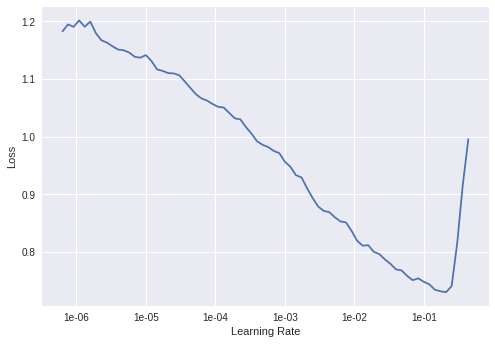

In [0]:
learn.lr_find()
learn.recorder.plot()

In [0]:
lr = 1e-03
callbacks_list = [ReduceLROnPlateauCallback(learn, monitor ='val_loss',  patience =2, factor=0.3),
                  SaveModelCallback(learn, every='improvement', monitor='val_loss',name='best')]
learn.fit_one_cycle(4,lr,callbacks = callbacks_list)
##
learn.save('densenet201-1')

epoch,train_loss,valid_loss,accuracy,auc_score,time
0,0.220326,0.243180,0.907670,0.959824,15:03
1,0.183561,0.234718,0.912805,0.965913,14:40
2,0.155845,0.209745,0.924531,0.970316,14:31
3,0.141627,0.185483,0.936325,0.976221,14:27


Better model found at epoch 0 with val_loss value: 0.24317976832389832.
Better model found at epoch 1 with val_loss value: 0.23471756279468536.
Better model found at epoch 2 with val_loss value: 0.2097454071044922.
Better model found at epoch 3 with val_loss value: 0.18548305332660675.


In [0]:
print('a')

a


In [0]:
learn.save('densenet201-1')

In [0]:
learn.load('densenet201-1');

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


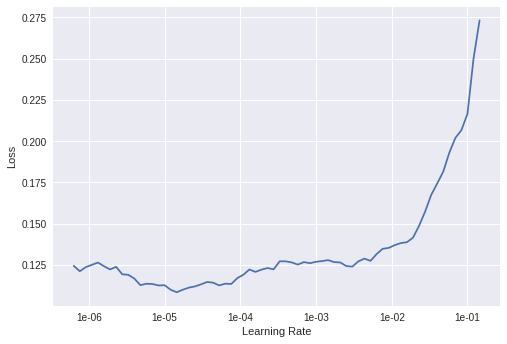

In [0]:
learn.lr_find()
learn.recorder.plot()
##learn.recorder.plot_losses()

In [0]:
#

In [0]:
#learn.lr_find()
#learn.recorder.plot()

In [0]:
lr = 4e-06

learn.fit_one_cycle(3,lr, callbacks = callbacks_list)

learn.save('densenet201-2')

epoch,train_loss,valid_loss,accuracy,auc_score,time
0,0.125839,0.191263,0.936212,0.975540,14:48
1,0.121039,0.183625,0.936462,0.976448,14:32
2,0.122608,0.194117,0.935894,0.975523,14:26


Better model found at epoch 0 with val_loss value: 0.19126252830028534.
Better model found at epoch 1 with val_loss value: 0.1836245357990265.


In [0]:
learn.save('densenet201-2')

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


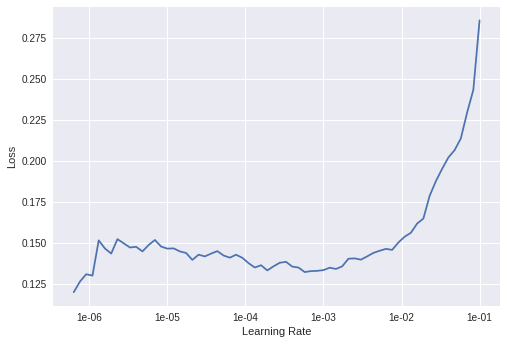

In [0]:
learn.lr_find()
learn.recorder.plot()

In [0]:
##lr = 1e-06

learn.fit_one_cycle(1,max_lr= slice(1e-05,1e-04), callbacks = callbacks_list)

learn.save('densenet201-3')

epoch,train_loss,valid_loss,accuracy,auc_score,time
0,0.127720,0.185932,0.937121,0.976264,14:23


Better model found at epoch 0 with val_loss value: 0.18593236804008484.


In [0]:
learn.load('densenet201-2');

In [0]:
learn.unfreeze()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


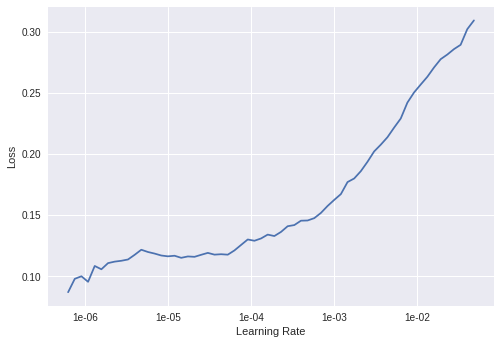

In [0]:
learn.lr_find()
learn.recorder.plot()

In [0]:
lr = 8e-06

learn.fit_one_cycle(2,lr, callbacks = callbacks_list)

epoch,train_loss,valid_loss,accuracy,auc_score,time
0,0.130363,0.194228,0.936325,0.974645,18:33
1,0.122287,0.176646,0.939098,0.977852,18:41


Better model found at epoch 0 with val_loss value: 0.19422823190689087.
Better model found at epoch 1 with val_loss value: 0.17664550244808197.


In [0]:
print('a')

In [0]:
learn.save('densenet201-4')

In [0]:
##lr = 1e-06

learn.fit_one_cycle(3,max_lr= slice(1e-06,2e-06,3e-06) callbacks = callbacks_list)

In [0]:
learn.load('densenet201-3');

In [0]:
learn.lr_find()
learn.recorder.plot()

In [0]:
lr = 4e-05

learn.fit_one_cycle(1,lr)

In [0]:
##learn.load('densenet201-2');

In [0]:
##Predit the validation data

preds,y=learn.get_preds()
pred_score=auc_score(preds,y)
pred_score

In [0]:
##Predit the validation data using TTA


preds,y=learn.TTA()
pred_score_tta=auc_score(preds,y)
pred_score_tta

In [0]:
interp = ClassificationInterpretation.from_learner(learn)



In [0]:
interp.plot_top_losses(9, figsize=(10,10))


In [0]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(title='Confusion matrix')


In [0]:
test_ids = [f.stem for f in learn.data.test_ds.items]
len(test_ids)

In [0]:
test_ids[1]

In [0]:
preds_test,y_test=learn.get_preds(ds_type=DatasetType.Test)

In [0]:
pred_list = list(preds_test[:,1].numpy())

In [0]:
pred_list[1]

In [0]:
##all together test set without TTA

test_ids = [f.stem for f in learn.data.test_ds.items]
##len(test_ids)
preds_test,y_test=learn.get_preds(ds_type=DatasetType.Test)
pred_list = list(preds_test[:,1].numpy())
submissions = pd.DataFrame({'id':test_ids,'label':pred_list})
submissions.to_csv('densenet201-fold1.csv', index = False, header = True)

In [0]:
##all together test set with TTA

test_ids = [f.stem for f in learn.data.test_ds.items]
##len(test_ids)
preds_test_tta,y_test_tta=learn.TTA(ds_type=DatasetType.Test)
pred_list = list(preds_test_tta[:,1].numpy())
submissions = pd.DataFrame({'id':test_ids,'label':pred_list})
submissions.to_csv('densenet201-fold1_TTA.csv', index = False, header = True)

In [0]:


# https://docs.fast.ai/basic_train.html#Test-time-augmentation
#preds_t = learn.TTA(ds_type=DatasetType.Test)

# each predictions give probabilty/chance of belonging to pos/neg class for all the test set images.
#preds_t[0].shape

In [0]:
submissions = pd.DataFrame({'id':test_ids,'label':pred_list})
submissions.to_csv('densenet201-fold1_TTA.csv', index = False, header = True)

In [0]:
from google.colab import files
files.download('densenet201-fold1.csv') 

In [0]:
arch = resnet152

learn = cnn_learner(
    data,
    arch,
    path='.',    
    metrics=[accuracy, auc_score], 
    ps=0.9 , wd = 0.3
)

learn.loss_fn = FocalLoss(gamma = 1.0)

In [0]:
lr = 1e-03
callbacks_list = [ReduceLROnPlateauCallback(learn, monitor ='val_loss',  patience =2, factor=0.5),
                  SaveModelCallback(learn, every='improvement', monitor='val_loss',name='best')]
learn.fit_one_cycle(15,lr,callbacks = callbacks_list)

In [0]:
test_ids = [f.stem for f in learn.data.test_ds.items]
##len(test_ids)
preds_test,y_test=learn.get_preds(ds_type=DatasetType.Test)
pred_list = list(preds_test[:,1].numpy())
submissions = pd.DataFrame({'id':test_ids,'label':pred_list})
submissions.to_csv('resnet152-fold1.csv', index = False, header = True)



In [0]:
from google.colab import files
files.download('resnet152-fold1.csv') 

In [0]:
"""
ResNet code gently borrowed from
https://github.com/pytorch/vision/blob/master/torchvision/models/resnet.py
"""
from __future__ import print_function, division, absolute_import
from collections import OrderedDict
import math

import torch.nn as nn
from torch.utils import model_zoo

__all__ = ['SENet', 'senet154', 'se_resnet50', 'se_resnet101', 'se_resnet152',
           'se_resnext50_32x4d', 'se_resnext101_32x4d']

pretrained_settings = {
    'senet154': {
        'imagenet': {
            'url': 'http://data.lip6.fr/cadene/pretrainedmodels/senet154-c7b49a05.pth',
            'input_space': 'RGB',
            'input_size': [3, 224, 224],
            'input_range': [0, 1],
            'mean': [0.485, 0.456, 0.406],
            'std': [0.229, 0.224, 0.225],
            'num_classes': 1000
        }
    },
    'se_resnet50': {
        'imagenet': {
            'url': 'http://data.lip6.fr/cadene/pretrainedmodels/se_resnet50-ce0d4300.pth',
            'input_space': 'RGB',
            'input_size': [3, 224, 224],
            'input_range': [0, 1],
            'mean': [0.485, 0.456, 0.406],
            'std': [0.229, 0.224, 0.225],
            'num_classes': 1000
        }
    },
    'se_resnet101': {
        'imagenet': {
            'url': 'http://data.lip6.fr/cadene/pretrainedmodels/se_resnet101-7e38fcc6.pth',
            'input_space': 'RGB',
            'input_size': [3, 224, 224],
            'input_range': [0, 1],
            'mean': [0.485, 0.456, 0.406],
            'std': [0.229, 0.224, 0.225],
            'num_classes': 1000
        }
    },
    'se_resnet152': {
        'imagenet': {
            'url': 'http://data.lip6.fr/cadene/pretrainedmodels/se_resnet152-d17c99b7.pth',
            'input_space': 'RGB',
            'input_size': [3, 224, 224],
            'input_range': [0, 1],
            'mean': [0.485, 0.456, 0.406],
            'std': [0.229, 0.224, 0.225],
            'num_classes': 1000
        }
    },
    'se_resnext50_32x4d': {
        'imagenet': {
            'url': 'http://data.lip6.fr/cadene/pretrainedmodels/se_resnext50_32x4d-a260b3a4.pth',
            'input_space': 'RGB',
            'input_size': [3, 224, 224],
            'input_range': [0, 1],
            'mean': [0.485, 0.456, 0.406],
            'std': [0.229, 0.224, 0.225],
            'num_classes': 1000
        }
    },
    'se_resnext101_32x4d': {
        'imagenet': {
            'url': 'http://data.lip6.fr/cadene/pretrainedmodels/se_resnext101_32x4d-3b2fe3d8.pth',
            'input_space': 'RGB',
            'input_size': [3, 224, 224],
            'input_range': [0, 1],
            'mean': [0.485, 0.456, 0.406],
            'std': [0.229, 0.224, 0.225],
            'num_classes': 1000
        }
    },
}


class SEModule(nn.Module):

    def __init__(self, channels, reduction):
        super(SEModule, self).__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.fc1 = nn.Conv2d(channels, channels // reduction, kernel_size=1,
                             padding=0)
        self.relu = nn.ReLU(inplace=True)
        self.fc2 = nn.Conv2d(channels // reduction, channels, kernel_size=1,
                             padding=0)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        module_input = x
        x = self.avg_pool(x)
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)
        x = self.sigmoid(x)
        return module_input * x


class Bottleneck(nn.Module):
    """
    Base class for bottlenecks that implements `forward()` method.
    """
    def forward(self, x):
        residual = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)
        out = self.relu(out)

        out = self.conv3(out)
        out = self.bn3(out)

        if self.downsample is not None:
            residual = self.downsample(x)

        out = self.se_module(out) + residual
        out = self.relu(out)

        return out


class SEBottleneck(Bottleneck):
    """
    Bottleneck for SENet154.
    """
    expansion = 4

    def __init__(self, inplanes, planes, groups, reduction, stride=1,
                 downsample=None):
        super(SEBottleneck, self).__init__()
        self.conv1 = nn.Conv2d(inplanes, planes * 2, kernel_size=1, bias=False)
        self.bn1 = nn.BatchNorm2d(planes * 2)
        self.conv2 = nn.Conv2d(planes * 2, planes * 4, kernel_size=3,
                               stride=stride, padding=1, groups=groups,
                               bias=False)
        self.bn2 = nn.BatchNorm2d(planes * 4)
        self.conv3 = nn.Conv2d(planes * 4, planes * 4, kernel_size=1,
                               bias=False)
        self.bn3 = nn.BatchNorm2d(planes * 4)
        self.relu = nn.ReLU(inplace=True)
        self.se_module = SEModule(planes * 4, reduction=reduction)
        self.downsample = downsample
        self.stride = stride


class SEResNetBottleneck(Bottleneck):
    """
    ResNet bottleneck with a Squeeze-and-Excitation module. It follows Caffe
    implementation and uses `stride=stride` in `conv1` and not in `conv2`
    (the latter is used in the torchvision implementation of ResNet).
    """
    expansion = 4

    def __init__(self, inplanes, planes, groups, reduction, stride=1,
                 downsample=None):
        super(SEResNetBottleneck, self).__init__()
        self.conv1 = nn.Conv2d(inplanes, planes, kernel_size=1, bias=False,
                               stride=stride)
        self.bn1 = nn.BatchNorm2d(planes)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3, padding=1,
                               groups=groups, bias=False)
        self.bn2 = nn.BatchNorm2d(planes)
        self.conv3 = nn.Conv2d(planes, planes * 4, kernel_size=1, bias=False)
        self.bn3 = nn.BatchNorm2d(planes * 4)
        self.relu = nn.ReLU(inplace=True)
        self.se_module = SEModule(planes * 4, reduction=reduction)
        self.downsample = downsample
        self.stride = stride


class SEResNeXtBottleneck(Bottleneck):
    """
    ResNeXt bottleneck type C with a Squeeze-and-Excitation module.
    """
    expansion = 4

    def __init__(self, inplanes, planes, groups, reduction, stride=1,
                 downsample=None, base_width=4):
        super(SEResNeXtBottleneck, self).__init__()
        width = math.floor(planes * (base_width / 64)) * groups
        self.conv1 = nn.Conv2d(inplanes, width, kernel_size=1, bias=False,
                               stride=1)
        self.bn1 = nn.BatchNorm2d(width)
        self.conv2 = nn.Conv2d(width, width, kernel_size=3, stride=stride,
                               padding=1, groups=groups, bias=False)
        self.bn2 = nn.BatchNorm2d(width)
        self.conv3 = nn.Conv2d(width, planes * 4, kernel_size=1, bias=False)
        self.bn3 = nn.BatchNorm2d(planes * 4)
        self.relu = nn.ReLU(inplace=True)
        self.se_module = SEModule(planes * 4, reduction=reduction)
        self.downsample = downsample
        self.stride = stride


class SENet(nn.Module):

    def __init__(self, block, layers, groups, reduction, dropout_p=0.2,
                 inplanes=128, input_3x3=True, downsample_kernel_size=3,
                 downsample_padding=1, num_classes=1000):
        """
        Parameters
        ----------
        block (nn.Module): Bottleneck class.
            - For SENet154: SEBottleneck
            - For SE-ResNet models: SEResNetBottleneck
            - For SE-ResNeXt models:  SEResNeXtBottleneck
        layers (list of ints): Number of residual blocks for 4 layers of the
            network (layer1...layer4).
        groups (int): Number of groups for the 3x3 convolution in each
            bottleneck block.
            - For SENet154: 64
            - For SE-ResNet models: 1
            - For SE-ResNeXt models:  32
        reduction (int): Reduction ratio for Squeeze-and-Excitation modules.
            - For all models: 16
        dropout_p (float or None): Drop probability for the Dropout layer.
            If `None` the Dropout layer is not used.
            - For SENet154: 0.2
            - For SE-ResNet models: None
            - For SE-ResNeXt models: None
        inplanes (int):  Number of input channels for layer1.
            - For SENet154: 128
            - For SE-ResNet models: 64
            - For SE-ResNeXt models: 64
        input_3x3 (bool): If `True`, use three 3x3 convolutions instead of
            a single 7x7 convolution in layer0.
            - For SENet154: True
            - For SE-ResNet models: False
            - For SE-ResNeXt models: False
        downsample_kernel_size (int): Kernel size for downsampling convolutions
            in layer2, layer3 and layer4.
            - For SENet154: 3
            - For SE-ResNet models: 1
            - For SE-ResNeXt models: 1
        downsample_padding (int): Padding for downsampling convolutions in
            layer2, layer3 and layer4.
            - For SENet154: 1
            - For SE-ResNet models: 0
            - For SE-ResNeXt models: 0
        num_classes (int): Number of outputs in `last_linear` layer.
            - For all models: 1000
        """
        super(SENet, self).__init__()
        self.inplanes = inplanes
        if input_3x3:
            layer0_modules = [
                ('conv1', nn.Conv2d(3, 64, 3, stride=2, padding=1,
                                    bias=False)),
                ('bn1', nn.BatchNorm2d(64)),
                ('relu1', nn.ReLU(inplace=True)),
                ('conv2', nn.Conv2d(64, 64, 3, stride=1, padding=1,
                                    bias=False)),
                ('bn2', nn.BatchNorm2d(64)),
                ('relu2', nn.ReLU(inplace=True)),
                ('conv3', nn.Conv2d(64, inplanes, 3, stride=1, padding=1,
                                    bias=False)),
                ('bn3', nn.BatchNorm2d(inplanes)),
                ('relu3', nn.ReLU(inplace=True)),
            ]
        else:
            layer0_modules = [
                ('conv1', nn.Conv2d(3, inplanes, kernel_size=7, stride=2,
                                    padding=3, bias=False)),
                ('bn1', nn.BatchNorm2d(inplanes)),
                ('relu1', nn.ReLU(inplace=True)),
            ]
        # To preserve compatibility with Caffe weights `ceil_mode=True`
        # is used instead of `padding=1`.
        layer0_modules.append(('pool', nn.MaxPool2d(3, stride=2,
                                                    ceil_mode=True)))
        self.layer0 = nn.Sequential(OrderedDict(layer0_modules))
        self.layer1 = self._make_layer(
            block,
            planes=64,
            blocks=layers[0],
            groups=groups,
            reduction=reduction,
            downsample_kernel_size=1,
            downsample_padding=0
        )
        self.layer2 = self._make_layer(
            block,
            planes=128,
            blocks=layers[1],
            stride=2,
            groups=groups,
            reduction=reduction,
            downsample_kernel_size=downsample_kernel_size,
            downsample_padding=downsample_padding
        )
        self.layer3 = self._make_layer(
            block,
            planes=256,
            blocks=layers[2],
            stride=2,
            groups=groups,
            reduction=reduction,
            downsample_kernel_size=downsample_kernel_size,
            downsample_padding=downsample_padding
        )
        self.layer4 = self._make_layer(
            block,
            planes=512,
            blocks=layers[3],
            stride=2,
            groups=groups,
            reduction=reduction,
            downsample_kernel_size=downsample_kernel_size,
            downsample_padding=downsample_padding
        )
        self.avg_pool = nn.AvgPool2d(7, stride=1)
        self.dropout = nn.Dropout(dropout_p) if dropout_p is not None else None
        self.last_linear = nn.Linear(512 * block.expansion, num_classes)

    def _make_layer(self, block, planes, blocks, groups, reduction, stride=1,
                    downsample_kernel_size=1, downsample_padding=0):
        downsample = None
        if stride != 1 or self.inplanes != planes * block.expansion:
            downsample = nn.Sequential(
                nn.Conv2d(self.inplanes, planes * block.expansion,
                          kernel_size=downsample_kernel_size, stride=stride,
                          padding=downsample_padding, bias=False),
                nn.BatchNorm2d(planes * block.expansion),
            )

        layers = []
        layers.append(block(self.inplanes, planes, groups, reduction, stride,
                            downsample))
        self.inplanes = planes * block.expansion
        for i in range(1, blocks):
            layers.append(block(self.inplanes, planes, groups, reduction))

        return nn.Sequential(*layers)

    def features(self, x):
        x = self.layer0(x)
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        return x

    def logits(self, x):
        x = self.avg_pool(x)
        if self.dropout is not None:
            x = self.dropout(x)
        x = x.view(x.size(0), -1)
        x = self.last_linear(x)
        return x

    def forward(self, x):
        x = self.features(x)
        x = self.logits(x)
        return x


def initialize_pretrained_model(model, num_classes, settings):
    assert num_classes == settings['num_classes'], \
        'num_classes should be {}, but is {}'.format(
            settings['num_classes'], num_classes)
    model.load_state_dict(model_zoo.load_url(settings['url']))
    model.input_space = settings['input_space']
    model.input_size = settings['input_size']
    model.input_range = settings['input_range']
    model.mean = settings['mean']
    model.std = settings['std']


def senet154(num_classes=1000, pretrained='imagenet'):
    model = SENet(SEBottleneck, [3, 8, 36, 3], groups=64, reduction=16,
                  dropout_p=0.2, num_classes=num_classes)
    if pretrained is not None:
        settings = pretrained_settings['senet154'][pretrained]
        initialize_pretrained_model(model, num_classes, settings)
    return model


def se_resnet50(num_classes=1000, pretrained='imagenet'):
    model = SENet(SEResNetBottleneck, [3, 4, 6, 3], groups=1, reduction=16,
                  dropout_p=None, inplanes=64, input_3x3=False,
                  downsample_kernel_size=1, downsample_padding=0,
                  num_classes=num_classes)
    if pretrained is not None:
        settings = pretrained_settings['se_resnet50'][pretrained]
        initialize_pretrained_model(model, num_classes, settings)
    return model


def se_resnet101(num_classes=1000, pretrained='imagenet'):
    model = SENet(SEResNetBottleneck, [3, 4, 23, 3], groups=1, reduction=16,
                  dropout_p=None, inplanes=64, input_3x3=False,
                  downsample_kernel_size=1, downsample_padding=0,
                  num_classes=num_classes)
    if pretrained is not None:
        settings = pretrained_settings['se_resnet101'][pretrained]
        initialize_pretrained_model(model, num_classes, settings)
    return model


def se_resnet152(num_classes=1000, pretrained='imagenet'):
    model = SENet(SEResNetBottleneck, [3, 8, 36, 3], groups=1, reduction=16,
                  dropout_p=None, inplanes=64, input_3x3=False,
                  downsample_kernel_size=1, downsample_padding=0,
                  num_classes=num_classes)
    if pretrained is not None:
        settings = pretrained_settings['se_resnet152'][pretrained]
        initialize_pretrained_model(model, num_classes, settings)
    return model


def se_resnext50_32x4d(num_classes=1000, pretrained='imagenet'):
    model = SENet(SEResNeXtBottleneck, [3, 4, 6, 3], groups=32, reduction=16,
                  dropout_p=None, inplanes=64, input_3x3=False,
                  downsample_kernel_size=1, downsample_padding=0,
                  num_classes=num_classes)
    if pretrained is not None:
        settings = pretrained_settings['se_resnext50_32x4d'][pretrained]
        initialize_pretrained_model(model, num_classes, settings)
    return model


def se_resnext101_32x4d(num_classes=1000, pretrained='imagenet'):
    model = SENet(SEResNeXtBottleneck, [3, 4, 23, 3], groups=32, reduction=16,
                  dropout_p=None, inplanes=64, input_3x3=False,
                  downsample_kernel_size=1, downsample_padding=0,
                  num_classes=num_classes)
    if pretrained is not None:
        settings = pretrained_settings['se_resnext101_32x4d'][pretrained]
        initialize_pretrained_model(model, num_classes, settings)
    return model

In [0]:
class LearnerModelBuilder():
    def __init__(self,model):
        self.model = model
    def get_layer_groups(self):
        return [self.model]


senet154 = senet154()

In [0]:
arch = senet154
type(arch)

In [0]:
#

learn = cnn_learner(
    data,
    arch,
    path='.',    
    metrics=[accuracy, auc_score], 
    ps=0.7 , wd = 0.3)

#learn.loss_fn = FocalLoss(gamma = 1.0)

In [0]:
lr = 1e-03
callbacks_list = [ReduceLROnPlateauCallback(learn, monitor ='val_loss',  patience =2, factor=0.5),
                  SaveModelCallback(learn, every='improvement', monitor='val_loss',name='best')]
learn.fit_one_cycle(15,lr,callbacks = callbacks_list)

In [0]:
test_ids = [f.stem for f in learn.data.test_ds.items]
##len(test_ids)
preds_test,y_test=learn.get_preds(ds_type=DatasetType.Test)
pred_list = list(preds_test[:,1].numpy())
submissions = pd.DataFrame({'id':test_ids,'label':pred_list})
submissions.to_csv('senet154-fold1.csv', index = False, header = True)

In [0]:
from google.colab import files
files.download('senet154-fold1.csv') 

####### Experimentation result

In [0]:
path = './input/'
tfms= get_transforms( do_flip=True, flip_vert=True, max_rotate=0, max_zoom=1., max_lighting=0.05, max_warp=0,
                      xtra_tfms=[random_rotate_img()])
                    ##  xtra_tfms=[random_rotate_img(),jitter() ])   jitter not working 
                    ##rotate(degrees=0),rotate(degrees=90), rotate(degrees=180),rotate(degrees=270)])
                    ##rotate(degrees=0, p=0.25), rotate(degrees=90, p=0.25), rotate(degrees=180, p=0.25), rotate(degrees=270, p=0.25),
                     ##, jitter = 0.5
                    
##batchsize
bs = 64
image_size = 96


data = (ImageList.from_df(df_fold1 ,path, suffix='.tif',folder='train')                       #Where to find the data? -> in path and its subfolders
        .split_by_idxs(train_idx, valid_idx)                            #How to split in train/valid? -> use the folders
        .label_from_df(cols = 1)                          #How to label? -> depending on the folder of the filenames
        .add_test_folder('test')                            #  Optionally add a test set (here default name is test)
        .transform(tfms, size=image_size)                       #Data augmentation? -> use tfms with a size of 64
        .databunch(bs = bs))                                #Finally? -> use the defaults for conversion to ImageDataBunch
        
stats=data.batch_stats()
data.normalize(imagenet_stats);
##data.normalize(stats)


In [0]:



from sklearn.metrics import roc_auc_score

def auc_score(y_pred,y_true,tens=True):
    score = roc_auc_score(y_true,torch.sigmoid(y_pred)[:,1])
    if tens:
        score = tensor(score)
    return score

class FocalLoss(nn.Module):
    def __init__(self, alpha=1, gamma=1., logits=False, reduction='elementwise_mean'):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.logits = logits
        self.reduction = reduction

    def forward(self, inputs, targets):
        if self.logits:
            BCE_loss = F.binary_cross_entropy_with_logits(inputs, targets, reduction='none')
        else:
            BCE_loss = F.binary_cross_entropy(inputs, targets, reduction='none')
        pt = torch.exp(-BCE_loss)
        F_loss = self.alpha * (1-pt)**self.gamma * BCE_loss

        if self.reduction is None:
            return F_loss
        else:
            return torch.mean(F_loss)


In [0]:
#############################
## Stage 1 
!pip install pretrainedmodels
import pretrainedmodels

In [0]:
## Stage 2
model_name = 'resnet50' # could be fbresnet152 or inceptionresnetv2
model_1 = pretrainedmodels.__dict__[model_name](num_classes=1000, pretrained='imagenet')

In [0]:
model_1

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=F

In [0]:
## Stage 3 (uncomment the below 1 line to see the densenet model)
##model_cadene  

## Stage 4
#custom_head3 = nn.Sequential(AdaptiveConcatPool2d(), Flatten(), nn.BatchNorm1d(3840), nn.Dropout(0.35),
#                            nn.Linear(in_features=3840, out_features=512,bias=True), nn.ReLU(),
#                            nn.BatchNorm1d(512), nn.Dropout(0.35),
#                             nn.Linear(in_features=512, out_features=256,bias=True), nn.ReLU(),
#                            nn.BatchNorm1d(256), nn.Dropout(0.7),
#                             nn.Linear(in_features=256, out_features=2,bias=True))
                            ##nn.LogSoftmax())

## I increased dropout from .35/.35/.7 to .8/.8/.8
##Resnet
custom_head3 = nn.Sequential(AdaptiveConcatPool2d(), Flatten(), nn.BatchNorm1d(4096), nn.Dropout(0.8),
                            nn.Linear(in_features=4096, out_features=512,bias=True), nn.ReLU(),
                            nn.BatchNorm1d(512), nn.Dropout(0.8),
                             nn.Linear(in_features=512, out_features=256,bias=True), nn.ReLU(),
                            nn.BatchNorm1d(256), nn.Dropout(0.8),
                             nn.Linear(in_features=256, out_features=2,bias=True))
##PNasnetLarge

#custom_head3 = nn.Sequential(
#                            nn.Linear(in_features=2048, out_features=2,bias=True))

##custom_head3

In [0]:
## Stage 5
model1 = nn.Sequential(*list(children(model_1))[:-2], custom_head3)
##learn3_tmp = cnn_learner.from_model_data(cadene_model_ch2, data)
learn1 = Learner(data, model1,wd = 0.2,path='.',metrics=[accuracy,auc_score])
learn1.loss_fn = FocalLoss(gamma = 1.0)
#learn1.model
print(data.c)
print(data.classes)

2
[0, 1]


In [0]:
learn1.model

Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace)
  (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (4): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (1

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


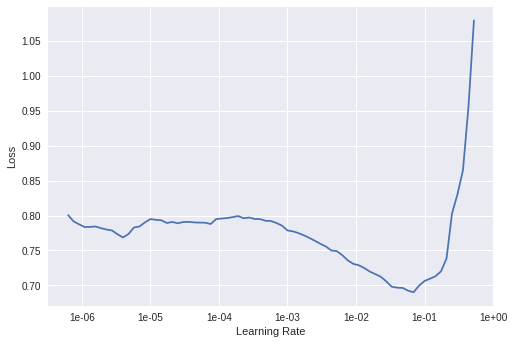

In [0]:
learn1.lr_find()
learn1.recorder.plot()

#lr = 8e-06

#learn1.fit_one_cycle(2,lr)

In [0]:
## I am increasing the dropout from .35/.35/.7 to .8/.8/.8
lr = 1e-03
#callbacks_list = [ReduceLROnPlateauCallback(learn, monitor ='val_loss',  patience =2, factor=0.5),
#                  SaveModelCallback(learn, every='improvement', monitor='val_loss',name='best')]

#learn1.fit_one_cycle(4,lr,callbacks = callbacks_list)
learn1.fit_one_cycle(1,lr)

epoch,train_loss,valid_loss,accuracy,auc_score,time
0,0.191840,0.194920,0.929826,0.972412,18:22


In [0]:
print('a')

a


In [0]:
learn1.save('resnet50-1')

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


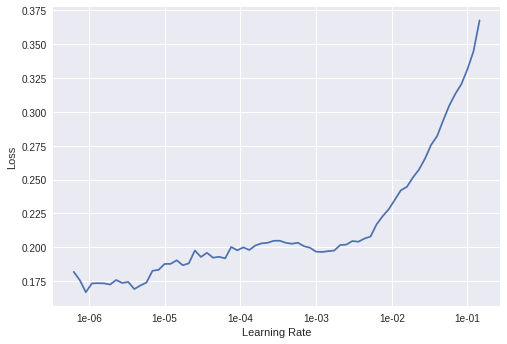

In [0]:
learn1.lr_find()
learn1.recorder.plot()

In [0]:
lr = 1e-06
#callbacks_list = [ReduceLROnPlateauCallback(learn, monitor ='val_loss',  patience =2, factor=0.5),
#                  SaveModelCallback(learn, every='improvement', monitor='val_loss',name='best')]

#learn1.fit_one_cycle(4,lr,callbacks = callbacks_list)
learn1.fit_one_cycle(1,lr)

epoch,train_loss,valid_loss,accuracy,auc_score,time
0,0.188085,0.188633,0.931962,0.973913,18:32


In [0]:
learn1.save('resnet50-2')

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


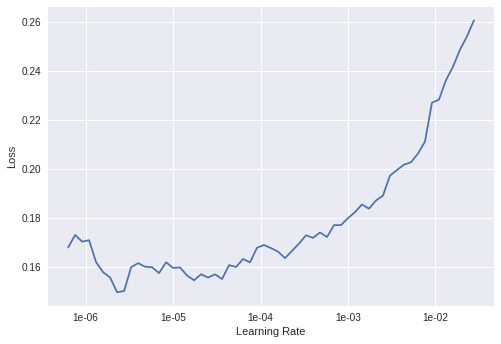

In [0]:
learn1.lr_find()
learn1.recorder.plot()

In [0]:
lr = 1e-06
#callbacks_list = [ReduceLROnPlateauCallback(learn, monitor ='val_loss',  patience =2, factor=0.5),
#                  SaveModelCallback(learn, every='improvement', monitor='val_loss',name='best')]

#learn1.fit_one_cycle(4,lr,callbacks = callbacks_list)
learn1.fit_one_cycle(1,lr)

epoch,train_loss,valid_loss,accuracy,auc_score,time
0,0.185137,0.191631,0.931212,0.973325,18:36


In [0]:
print('a')

a


In [0]:
learn1.save('resnet50-3')

In [0]:
learn1.load('densenet201-2');

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


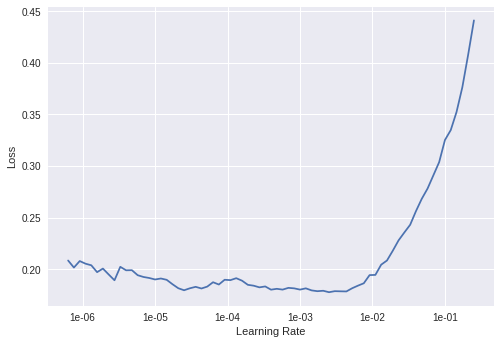

In [0]:
learn1.lr_find()
learn1.recorder.plot()

In [0]:
lr = 8e-06
#callbacks_list = [ReduceLROnPlateauCallback(learn, monitor ='val_loss',  patience =2, factor=0.5),
#                  SaveModelCallback(learn, every='improvement', monitor='val_loss',name='best')]

#learn1.fit_one_cycle(4,lr,callbacks = callbacks_list)
learn1.fit_one_cycle(1,lr)

epoch,train_loss,valid_loss,accuracy,auc_score,time
0,0.168560,0.188068,0.933053,0.973525,18:35


In [0]:
learn1.save('densenet201-4')

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


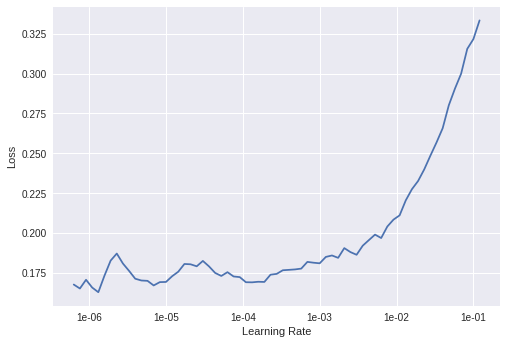

In [0]:
learn1.lr_find()
learn1.recorder.plot()

In [0]:
lr = 5e-06
#callbacks_list = [ReduceLROnPlateauCallback(learn, monitor ='val_loss',  patience =2, factor=0.5),
#                  SaveModelCallback(learn, every='improvement', monitor='val_loss',name='best')]

#learn1.fit_one_cycle(4,lr,callbacks = callbacks_list)
learn1.fit_one_cycle(1,lr)

epoch,train_loss,valid_loss,accuracy,auc_score,time
0,0.183555,0.185617,0.933189,0.974224,18:37


In [0]:
learn1.save('resnet50-5')

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


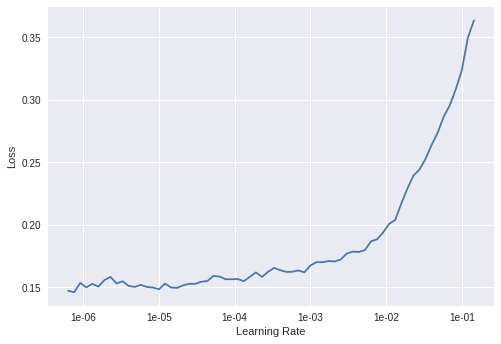

In [0]:
learn1.lr_find()
learn1.recorder.plot()

In [0]:
print('a')

a


In [0]:
preds,y=learn1.get_preds()
pred_score=auc_score(preds,y)
pred_score

In [0]:
##all together test set with TTA

test_ids = [f.stem for f in learn.data.test_ds.items]
##len(test_ids)
preds_test_tta,y_test_tta=learn.TTA(ds_type=DatasetType.Test)
pred_list = list(preds_test_tta[:,1].numpy())
submissions = pd.DataFrame({'id':test_ids,'label':pred_list})
submissions.to_csv('densenet201-fold1_TTA.csv', index = False, header = True)

In [0]:
from google.colab import files

In [0]:

##Predit the validation data

valid_ids = [f.split('/')[-1] for f in learn1.data.valid_ds.items]
print(len(valid_ids))
preds,y=learn1.get_preds()
pred_val_list = list(preds[:,1].numpy())
##pred_score
submissions = pd.DataFrame({'id':valid_ids,'True Label':y,'Pred val_label':pred_val_list})
submissions.to_csv('resnet50-val-fold1.csv', index = False, header = True)
pred_score=auc_score(preds,y)
print('Val without TTA:',pred_score)




Val without TTA: tensor(0.9743)


In [0]:
submissions.head(3)

,Pred val_label,True Label,id
0,0.291429,0,472043c90b87eff0915a36d4a6497f33d43c7b10.tif
1,0.997216,1,a03aa5f0d1138e607998f63249dbf1023e25bd9d.tif
2,0.022357,0,c7b1de3daa6c499f364c583317f739445d04b15a.tif


In [0]:
files.download('resnet50-val-fold1.csv') 

In [0]:
##learn1.data.valid_ds.items[1].split('/')[-1]

In [0]:
##Predit the validation data using TTA

valid_ids = [f.split('/')[-1]  for f in learn1.data.valid_ds.items]
preds,y=learn1.TTA()
pred_val_list = list(preds[:,1].numpy())
##pred_score
submissions = pd.DataFrame({'id':valid_ids,'True Label':y,'Pred val_label':pred_val_list})
submissions.to_csv('resnet50-val-fold1-TTA.csv', index = False, header = True)
pred_score_tta=auc_score(preds,y)
##pred_score_tta
print('Val with TTA:',pred_score_tta)


Val with TTA: tensor(0.9593)


In [0]:
submission1['Pred val_label']= submission1['Pred val_label'].astype(torch.FloatTensor)
submission1['True Label']= submission1['True Label'].astype(torch.FloatTensor)

In [0]:
roc_auc_score(submission1['True Label'],torch.sigmoid(submission1['Pred val_label']))

TypeError: ignored

In [0]:
submission1 =  pd.read_csv('resnet50-val-fold1-TTA.csv')
submission1.head(1)['Pred val_label']
#roc_auc_score(submission1['Pred val_label'],submission1['True Label'])

0    0.550906
Name: Pred val_label, dtype: float64

In [0]:
submissions = pd.DataFrame({'id':valid_ids,'True Label':y,'Pred val_label':preds})
submissions.to_csv('resnet50-val-fold1-TTA-for-blending.csv', index = False, header = True)
files.download('resnet50-val-fold1-TTA-for-blending.csv') 

In [0]:
files.download('resnet50-val-fold1-TTA.csv') 

In [0]:
##all together test set without TTA

test_ids = [f.stem for f in learn1.data.test_ds.items]
##len(test_ids)
preds_test,y_test=learn1.get_preds(ds_type=DatasetType.Test)
pred_list = list(preds_test[:,1].numpy())
submissions = pd.DataFrame({'id':test_ids,'label':pred_list})
submissions.to_csv('resnet50-test-fold1.csv', index = False, header = True)



In [0]:
files.download('resnet50-test-fold1.csv')

In [0]:
##all together test set with TTA

test_ids = [f.stem for f in learn1.data.test_ds.items]
##len(test_ids)
preds_test_tta,y_test_tta=learn1.TTA(ds_type=DatasetType.Test)
pred_list = list(preds_test_tta[:,1].numpy())
submissions = pd.DataFrame({'id':test_ids,'label':pred_list})
submissions.to_csv('resnet50-test-fold1_TTA.csv', index = False, header = True)



In [0]:
files.download('resnet50-test-fold1_TTA.csv')

In [0]:
##Upload train file 
from google.colab import files
files.upload()

Saving resnet50-test-fold1_TTA.csv to resnet50-test-fold1_TTA (1).csv
Saving submission_tta_32.csv to submission_tta_32.csv


{'resnet50-test-fold1_TTA.csv': b'id,label\ncc50c4e0f08e7ba01b44d402d1dda0f42af6b749,0.5261408686637878\n982aece152f5a35322b1d2aba7b7faf334ab3475,0.9893206357955933\nfea6ab853ff39f53a831db7cea4892361a403bc1,0.9829221367835999\n37a68e6577e065bc85d3d07af1fee5882010743a,0.3105752766132355\n607141edf6d65de2109dedb20cf3abda601a159b,0.36225563287734985\n6c4b92a94994c338abf4b3578d481f1f47544c9c,0.9636542797088623\n75c979b73045caa93ae3066661096c2425089f67,0.803642749786377\n50a12491aa42b22baa9ea1317744bb3c2085d9fe,0.013285841792821884\n5ca0d958e3675a36f96826357e3398aace00d1de,0.019936811178922653\n41b98f9b235917033d501ac4557c43dd3e2af12e,0.18077298998832703\n16f5ce0acaf3d75e78bc26eb9682973e7a2611d9,0.9866923093795776\n14a9e38a74671417834cac190db7441bcb9f3ca5,0.1406586915254593\ne90cb4051dee3778218a1aea5f33314367bb3bb0,0.5507808923721313\nce20b1f100437d1fac0c8daf21231ffbc422e883,0.0724310353398323\n1800fc5760633b48080f2a71fa6dd23bb9f97e4c,0.2725849151611328\n9626afc6bcc327032e9097651b3913698c6a

In [0]:
import pandas as pd

submission1 = pd.read_csv('resnet50-test-fold1_TTA.csv')
submission1.columns= ['id', 'label1']
submission2 = pd.read_csv('submission_tta_32.csv')
submission2.columns= ['id', 'label2']

In [0]:
submission = submission1.merge(submission2 , on = 'id')
sumbission.head(2)

,id,label1,label2
0,cc50c4e0f08e7ba01b44d402d1dda0f42af6b749,0.526141,0.896865
1,982aece152f5a35322b1d2aba7b7faf334ab3475,0.989321,0.978325


In [0]:
submission['label'] = 0.2*submission['label1'] + 0.8*submission['label2']
submission[['id', 'label']].to_csv('submission.csv',index = False)



In [0]:
submission.columns

Index(['id', 'label1', 'label2', 'label'], dtype='object')

In [0]:
from google.colab import files
files.download('submission.csv') 